# Exploring the ERA5 Dataset

In [6]:
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable
from IPython.display import Image, display
import cartopy
import cartopy.crs


In [7]:
base_path = '/data/users/dscop/dscop_tutorial/'
accumulation = 'ERA5-accum.nc'
instant = 'ERA5-instant.nc'

In [8]:
era5_dataset_accum = xr.open_dataset(base_path + accumulation, engine='netcdf4')
era5_dataset_instant = xr.open_dataset(base_path + instant, engine='netcdf4')
era5_dataset = xr.merge([era5_dataset_accum, era5_dataset_instant])
era5_dataset = era5_dataset.rename({"valid_time": "time"})

/var/tmp/ipykernel_685470/4151770423.py:3: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  era5_dataset = xr.merge([era5_dataset_accum, era5_dataset_instant])
/var/tmp/ipykernel_685470/4151770423.py:3: FutureWarning: In a future version of xarray the default value for compat will change from compat='no_conflicts' to compat='override'. This is likely to lead to different results when combining overlapping variables with the same name. To opt in to new defaults and get rid of these warnings now use `set_options(use_new_combine_kwarg_defaults=True) or set compat explicitly.
  era5_dataset = xr.merge([era5_dataset_accum, era5_dataset_instant])


We use Xarray on Gridded data,

![image.png](https://docs.xarray.dev/en/stable/_images/dataset-diagram.png)

In [9]:
print(era5_dataset.dims)
print(era5_dataset.coords)
print(era5_dataset.data_vars)

FrozenMappingWarningOnValuesAccess({'time': 2192, 'latitude': 45, 'longitude': 49})
Coordinates:
  * time       (time) datetime64[ns] 18kB 2023-01-01 ... 2025-12-31T12:00:00
  * latitude   (latitude) float64 360B 60.0 59.75 59.5 59.25 ... 49.5 49.25 49.0
  * longitude  (longitude) float64 392B -10.0 -9.75 -9.5 -9.25 ... 1.5 1.75 2.0
    number     int64 8B 0
    expver     (time) <U4 35kB '0001' '0001' '0001' ... '0001' '0001' '0001'
Data variables:
    tp       (time, latitude, longitude) float32 19MB ...
    u10      (time, latitude, longitude) float32 19MB ...
    v10      (time, latitude, longitude) float32 19MB ...
    msl      (time, latitude, longitude) float32 19MB ...
    ptype    (time, latitude, longitude) float32 19MB ...


Process the data and create new parameters

In [10]:
era5_dataset["wind_speed"] = np.sqrt(era5_dataset.u10**2 + era5_dataset.v10**2)
era5_dataset["msl_hpa"] = era5_dataset["msl"] / 100

Values of precipitation type defined in the IFS: 0: No precipitation, 1: Rain, 3: Freezing rain (i.e. supercooled raindrops which freeze on contact with the ground and other surfaces), 5: Snow, 6: Wet snow (i.e. snow particles which are starting to melt); 7: Mixture of rain and snow, 8: Ice pellets

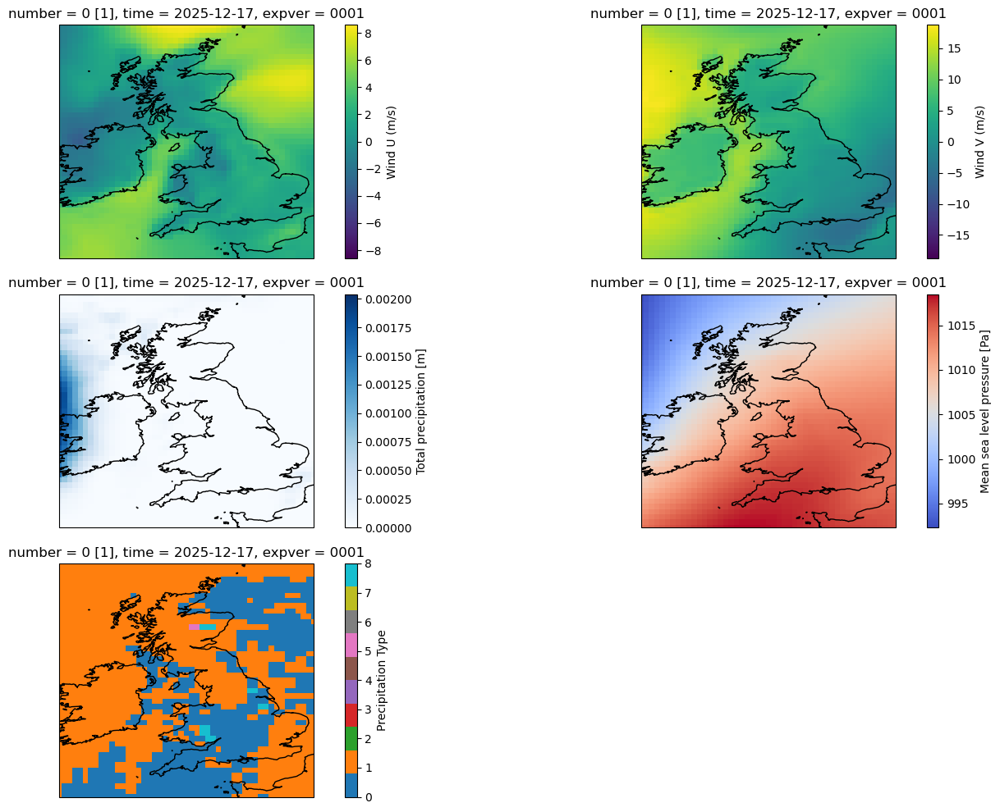

In [11]:
# Take a random date from the dataset to visualize
random_date = np.random.choice(era5_dataset.time.values)

# Show the geographical extent of the dataset
lat_min = era5_dataset.latitude.min().values
lat_max = era5_dataset.latitude.max().values
lon_min = era5_dataset.longitude.min().values
lon_max = era5_dataset.longitude.max().values


fig, axs = plt.subplots(
    3, 2,
    figsize=(15, 10),
    subplot_kw={'projection': cartopy.crs.PlateCarree()}
)

date_str = pd.to_datetime(random_date).strftime('%Y-%m-%d %H:%M:%S')

# Wind U
ax = axs[0, 0]
ax.add_feature(cartopy.feature.LAND)
ax.add_feature(cartopy.feature.COASTLINE)
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cartopy.crs.PlateCarree())
ax.set_title(f"Wind U (m/s) on {date_str}")
era5_dataset.u10.sel(time=random_date).plot(ax=ax, transform=cartopy.crs.PlateCarree(), cmap='viridis', cbar_kwargs={'label': 'Wind U (m/s)'})

# Wind V
ax = axs[0, 1]
ax.add_feature(cartopy.feature.LAND)
ax.add_feature(cartopy.feature.COASTLINE)
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cartopy.crs.PlateCarree())
ax.set_title(f"Wind V (m/s) on {date_str}")
era5_dataset.v10.sel(time=random_date).plot(ax=ax, transform=cartopy.crs.PlateCarree(), cmap='viridis', cbar_kwargs={'label': 'Wind V (m/s)'})


# MSLP
ax = axs[1, 1]
ax.add_feature(cartopy.feature.LAND)
ax.add_feature(cartopy.feature.COASTLINE)
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cartopy.crs.PlateCarree())
ax.set_title(f"MSLP (hPa) on {date_str}")
era5_dataset.msl_hpa.sel(time=random_date).plot(ax=ax, transform=cartopy.crs.PlateCarree(), cmap='coolwarm')

# Total Precipitation
ax = axs[1, 0]
ax.add_feature(cartopy.feature.LAND)
ax.add_feature(cartopy.feature.COASTLINE)
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cartopy.crs.PlateCarree())
ax.set_title(f"Total Precipitation (m) on {date_str}")
era5_dataset.tp.sel(time=random_date).plot(ax=ax, transform=cartopy.crs.PlateCarree(), cmap='Blues')

# precip type
ax = axs[2, 0]
ax.add_feature(cartopy.feature.LAND)
ax.add_feature(cartopy.feature.COASTLINE)
ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cartopy.crs.PlateCarree())
ax.set_title(f"Precipitation Type on {date_str}")
era5_dataset.ptype.sel(time=random_date).plot(ax=ax, transform=cartopy.crs.PlateCarree(), cmap='tab10', cbar_kwargs={'label': 'Precipitation Type'})

# Disabling the last subplot since we have only 5 variables to plot
axs[2, 1].axis('off')


plt.tight_layout()
plt.show()

## Monthly climatology

Compute
monthly = ds.groupby("time.month").mean()

Then compare
average pressure
average rainfall
average wind speed

Good introduction to grouping.

In [12]:
monthly_data = era5_dataset.groupby('time.month').mean(dim='time')

In [13]:
months = era5_dataset['time.month'].values
months_unique = np.unique(months)
months_unique

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

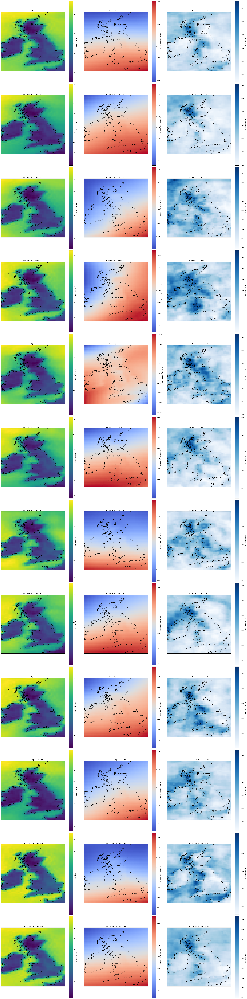

In [14]:

fig, axs = plt.subplots(
    12, 3,
    figsize=(30, 120),
    subplot_kw={'projection': cartopy.crs.PlateCarree()}
)

for month in range(1, 13):
    # Wind Speed
    ax = axs[month - 1, 0]
    ax.add_feature(cartopy.feature.LAND)
    ax.add_feature(cartopy.feature.COASTLINE)
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cartopy.crs.PlateCarree())
    ax.set_title(f"Wind Speed (m/s) in Month {month}")
    monthly_data.wind_speed.sel(month=month).plot(ax=ax, transform=cartopy.crs.PlateCarree(), cmap='viridis', cbar_kwargs={'label': 'Wind Speed (m/s)'})

    # MSLP
    ax = axs[month - 1, 1]
    ax.add_feature(cartopy.feature.LAND)
    ax.add_feature(cartopy.feature.COASTLINE)
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cartopy.crs.PlateCarree())
    ax.set_title(f"MSLP (hPa) in Month {month}")
    monthly_data.msl_hpa.sel(month=month).plot(ax=ax, transform=cartopy.crs.PlateCarree(), cmap='coolwarm')

    # Total Precipitation
    ax = axs[month - 1, 2]
    ax.add_feature(cartopy.feature.LAND)
    ax.add_feature(cartopy.feature.COASTLINE)
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cartopy.crs.PlateCarree())
    ax.set_title(f"Total Precipitation (m) in Month {month}")
    monthly_data.tp.sel(month=month).plot(ax=ax, transform=cartopy.crs.PlateCarree(), cmap='Blues')

plt.tight_layout()
plt.show()

## Storm tracking

Question
Can you identify the passage of an Atlantic low-pressure system over the UK?

Tasks:
- Plot MSLP every 12 hours.
- Overlay wind arrows.
- Identify the centre of lowest pressure.
- Describe how the winds circulate around the low.
- Where is the heaviest rainfall?
- How does the system move over several days?
- What type of precipitation is it?

Storm Claudia

10–17 November 2025

![alt text](https://upload.wikimedia.org/wikipedia/commons/7/7f/Storm-Claudia-2025.png)


In [15]:
dates_of_interest = pd.date_range(start='2025-11-10', end='2025-11-18', freq='12h', inclusive='left')
dates_of_interest

DatetimeIndex(['2025-11-10 00:00:00', '2025-11-10 12:00:00',
               '2025-11-11 00:00:00', '2025-11-11 12:00:00',
               '2025-11-12 00:00:00', '2025-11-12 12:00:00',
               '2025-11-13 00:00:00', '2025-11-13 12:00:00',
               '2025-11-14 00:00:00', '2025-11-14 12:00:00',
               '2025-11-15 00:00:00', '2025-11-15 12:00:00',
               '2025-11-16 00:00:00', '2025-11-16 12:00:00',
               '2025-11-17 00:00:00', '2025-11-17 12:00:00'],
              dtype='datetime64[ns]', freq='12h')

In [16]:
# Get the data for the dates of interest
storm_data = era5_dataset.sel(time=dates_of_interest)
storm_data

<xarray.Dataset> Size: 989kB
Dimensions:     (time: 16, latitude: 45, longitude: 49)
Coordinates:
  * time        (time) datetime64[ns] 128B 2025-11-10 ... 2025-11-17T12:00:00
  * latitude    (latitude) float64 360B 60.0 59.75 59.5 ... 49.5 49.25 49.0
  * longitude   (longitude) float64 392B -10.0 -9.75 -9.5 -9.25 ... 1.5 1.75 2.0
    number      int64 8B 0
    expver      (time) <U4 256B '0001' '0001' '0001' ... '0001' '0001' '0001'
Data variables:
    tp          (time, latitude, longitude) float32 141kB ...
    u10         (time, latitude, longitude) float32 141kB 2.61 2.546 ... 0.5473
    v10         (time, latitude, longitude) float32 141kB 3.465 3.595 ... -4.502
    msl         (time, latitude, longitude) float32 141kB 1e+05 ... 1.019e+05
    ptype       (time, latitude, longitude) float32 141kB ...
    wind_speed  (time, latitude, longitude) float32 141kB 4.338 4.405 ... 4.536
    msl_hpa     (time, latitude, longitude) float32 141kB 1e+03 ... 1.019e+03
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2026-06-26T11:04 GRIB to CDM+CF via cfgrib-0.9.1...

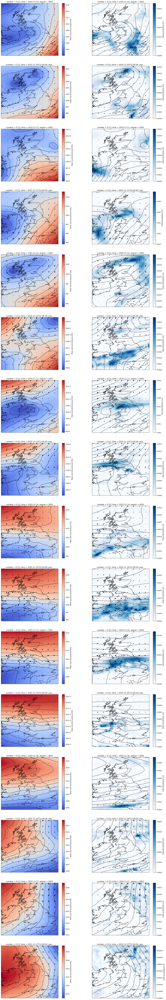

In [17]:
# Plotting the mslp and specipitation for the storm event

fig, axs = plt.subplots(
    len(dates_of_interest), 2,
    figsize=(20, 120),
    subplot_kw={'projection': cartopy.crs.PlateCarree()}
)

for i, date in enumerate(dates_of_interest):
    date_str = pd.to_datetime(date).strftime('%Y-%m-%d %H:%M:%S')

    # MSLP
    ax = axs[i, 0]
    ax.add_feature(cartopy.feature.LAND)
    ax.add_feature(cartopy.feature.COASTLINE)
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cartopy.crs.PlateCarree())
    ax.set_title(f"MSLP (hPa) on {date_str}")
    storm_data.msl_hpa.sel(time=date).plot(ax=ax, transform=cartopy.crs.PlateCarree(), cmap='coolwarm')

    # Contour lines for MSLP
    mslp = storm_data.msl_hpa.sel(time=date)
    ax.contour(mslp.longitude, mslp.latitude, mslp, levels=10, colors='black', linestyles='dashed', transform=cartopy.crs.PlateCarree())

    # Adding wind vectors
    u = storm_data.u10.sel(time=date)
    v = storm_data.v10.sel(time=date)
    ax.quiver(
        u.longitude.values[::5],
        u.latitude.values[::5],
        u.values[::5, ::5],
        v.values[::5, ::5],
        transform=cartopy.crs.PlateCarree(),
        color='black',
        scale=500
    )

    # Total Precipitation
    ax2 = axs[i, 1]
    ax2.add_feature(cartopy.feature.LAND)
    ax2.add_feature(cartopy.feature.COASTLINE)
    ax2.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cartopy.crs.PlateCarree())
    ax2.set_title(f"Total Precipitation (m) on {date_str}")
    storm_data.tp.sel(time=date).plot(ax=ax2, transform=cartopy.crs.PlateCarree(), cmap='Blues')
    ax2.contour(mslp.longitude, mslp.latitude, mslp, levels=10, colors='black', linestyles='dashed', transform=cartopy.crs.PlateCarree())
    ax2.quiver(
        u.longitude.values[::5],
        u.latitude.values[::5],
        u.values[::5, ::5],
        v.values[::5, ::5],
        transform=cartopy.crs.PlateCarree(),
        color='black',
        scale=500
    )



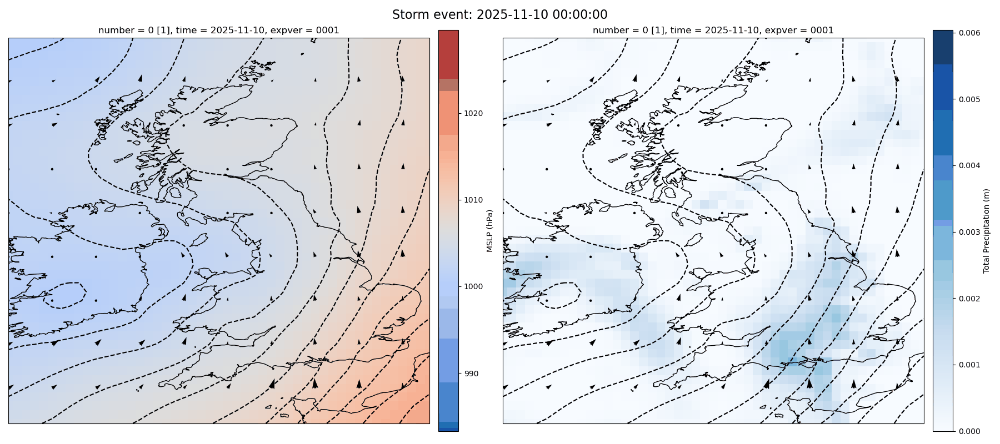

In [18]:
gif_path = "storm.gif"

fig, axs = plt.subplots(
    1, 2,
    figsize=(18, 8),
    subplot_kw={"projection": cartopy.crs.PlateCarree()}
)

mslp_vmin = float(storm_data.msl_hpa.min())
mslp_vmax = float(storm_data.msl_hpa.max())
tp_vmin = float(storm_data.tp.min())
tp_vmax = float(storm_data.tp.max())

mslp_norm = Normalize(vmin=mslp_vmin, vmax=mslp_vmax)
tp_norm = Normalize(vmin=tp_vmin, vmax=tp_vmax)

# Create one shared colourbar for MSLP and one for precipitation
mslp_sm = ScalarMappable(norm=mslp_norm, cmap="coolwarm")
mslp_sm.set_array([])
tp_sm = ScalarMappable(norm=tp_norm, cmap="Blues")
tp_sm.set_array([])

fig.colorbar(mslp_sm, ax=axs[0], orientation="vertical", pad=0.02, fraction=0.046, label="MSLP (hPa)")
fig.colorbar(tp_sm, ax=axs[1], orientation="vertical", pad=0.02, fraction=0.046, label="Total Precipitation (m)")

def draw_frame(date):
    date_str = pd.to_datetime(date).strftime("%Y-%m-%d %H:%M:%S")
    mslp = storm_data.msl_hpa.sel(time=date)
    u = storm_data.u10.sel(time=date)
    v = storm_data.v10.sel(time=date)
    tp = storm_data.tp.sel(time=date)

    for ax in axs:
        ax.clear()
        ax.add_feature(cartopy.feature.LAND)
        ax.add_feature(cartopy.feature.COASTLINE)
        ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=cartopy.crs.PlateCarree())

    ax = axs[0]
    ax.set_title(f"MSLP (hPa) on {date_str}")
    mslp.plot(
        ax=ax,
        transform=cartopy.crs.PlateCarree(),
        cmap="coolwarm",
        vmin=mslp_vmin,
        vmax=mslp_vmax,
        add_colorbar=False
    )
    ax.contour(
        mslp.longitude, mslp.latitude, mslp,
        levels=10, colors="black", linestyles="dashed",
        transform=cartopy.crs.PlateCarree()
    )
    ax.quiver(
        u.longitude.values[::5],
        u.latitude.values[::5],
        u.values[::5, ::5],
        v.values[::5, ::5],
        transform=cartopy.crs.PlateCarree(),
        color="black",
        scale=500
    )

    ax = axs[1]
    ax.set_title(f"Total Precipitation (m) on {date_str}")
    tp.plot(
        ax=ax,
        transform=cartopy.crs.PlateCarree(),
        cmap="Blues",
        vmin=tp_vmin,
        vmax=tp_vmax,
        add_colorbar=False
    )
    ax.contour(
        mslp.longitude, mslp.latitude, mslp,
        levels=10, colors="black", linestyles="dashed",
        transform=cartopy.crs.PlateCarree()
    )
    ax.quiver(
        u.longitude.values[::5],
        u.latitude.values[::5],
        u.values[::5, ::5],
        v.values[::5, ::5],
        transform=cartopy.crs.PlateCarree(),
        color="black",
        scale=500
    )

    fig.suptitle(f"Storm event: {date_str}", fontsize=16)
    plt.tight_layout()

anim = FuncAnimation(
    fig,
    draw_frame,
    frames=dates_of_interest,
    interval=500,
    repeat=True
)

anim.save(gif_path, writer=PillowWriter(fps=2))
plt.close(fig)

display(Image(filename=gif_path))


Explore Storm Amy 01/10/2025 - 06/10/2025
- Identify the centre of lowest pressure.
- Describe how the winds circulate around the low.
- Where is the heaviest rainfall?
- How does the system move over several days?

![image.png](https://upload.wikimedia.org/wikipedia/commons/3/34/Storm_Amy_2025_path.png)